In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import scipy
from scipy.optimize import curve_fit


import sys
sys.path.append('../')
from custom_tools import plot_2D_pulse, plot_one_pulse, get_mids_from_edges

this_directory = '/home/bas/Documents/Projects/x-psi/xpsi-bas-fork/AMXPs/model_data/J1808/2019/finer_data/'

counts = np.reshape(np.loadtxt(this_directory+'2019_photon_count.csv', skiprows=1), (1023, 64))
phase_edges = np.loadtxt(this_directory+'2019_phase_edge.csv', skiprows=1)
energy_edges = np.loadtxt(this_directory+'2019_energy_edge.csv', skiprows=1)


/=============================================\
| X-PSI: X-ray Pulse Simulation and Inference |
|---------------------------------------------|
|                Version: 2.0.0               |
|---------------------------------------------|
|      https://xpsi-group.github.io/xpsi      |
\=============================================/

Imported GetDist version: 1.4
Imported nestcheck version: 0.2.1


In [2]:
phase_mids = get_mids_from_edges(phase_edges)
energy_mids = get_mids_from_edges(energy_edges)



In [10]:
energy_edges[0:571]


array([0.3 , 0.31, 0.32, 0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 ,
       0.41, 0.42, 0.43, 0.44, 0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51,
       0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62,
       0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73,
       0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84,
       0.85, 0.86, 0.87, 0.88, 0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95,
       0.96, 0.97, 0.98, 0.99, 1.  , 1.01, 1.02, 1.03, 1.04, 1.05, 1.06,
       1.07, 1.08, 1.09, 1.1 , 1.11, 1.12, 1.13, 1.14, 1.15, 1.16, 1.17,
       1.18, 1.19, 1.2 , 1.21, 1.22, 1.23, 1.24, 1.25, 1.26, 1.27, 1.28,
       1.29, 1.3 , 1.31, 1.32, 1.33, 1.34, 1.35, 1.36, 1.37, 1.38, 1.39,
       1.4 , 1.41, 1.42, 1.43, 1.44, 1.45, 1.46, 1.47, 1.48, 1.49, 1.5 ,
       1.51, 1.52, 1.53, 1.54, 1.55, 1.56, 1.57, 1.58, 1.59, 1.6 , 1.61,
       1.62, 1.63, 1.64, 1.65, 1.66, 1.67, 1.68, 1.69, 1.7 , 1.71, 1.72,
       1.73, 1.74, 1.75, 1.76, 1.77, 1.78, 1.79, 1.

In [3]:
half = int(len(phase_mids)/2)
print('total counts:',np.sum(counts[:,:half])) #cutting off half of data to measure total counts since phase goes up to 2.

total counts: 24999085.0


(<Figure size 500x300 with 2 Axes>,
 <AxesSubplot: xlabel='Phase', ylabel='Energy (keV)'>)

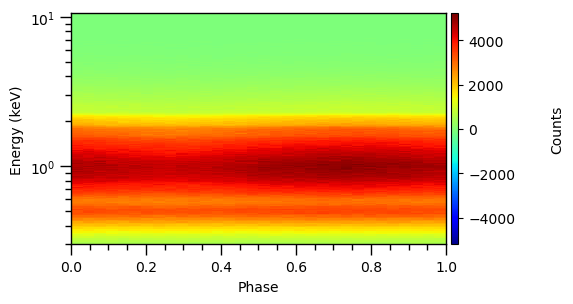

In [4]:
plot_one_pulse(counts, phase_mids, energy_mids, cm=cm.jet)

# Fitting

In [5]:
def sinfunc(phase, A, p, c):
    
    return A * np.sin(phase*2.0*np.pi + p) + c


def sin2func(phase, A, p, c, A2, p2):

        return A*np.sin(phase*2.0*np.pi + p) + A2*np.sin(phase*4.0*np.pi + p2) + c

In [6]:
def fit2sin(phase, counts):
    
    
    #counts=data.sum(axis=0)

    c0 = 6500
    A0 = 1000
    p0 = 0.15*2.0*np.pi
    A20 = 100
    p20 = 0.01*2.0*np.pi

    guess = [A0, p0,c0, A20, p20]
    popt, pcov = scipy.optimize.curve_fit(sin2func, phase, counts, p0=guess)
    #A, p, c, A2, p2 = popt
    #print(popt)
    
    return popt 

 
def fitsin(phase, counts):
    
    
    #counts=data.sum(axis=0)

    c0 = 6500
    A0 = 1000
    p0 = 0.15*2.0*np.pi
    A20 = 100
    p20 = 0.01*2.0*np.pi

    guess = [A0, p0,c0]
    popt, pcov = scipy.optimize.curve_fit(sinfunc, phase, counts, p0=guess)
    perr = np.sqrt(np.diag(pcov))
    
    return popt, perr

In [7]:
n_energies = len(energy_mids)

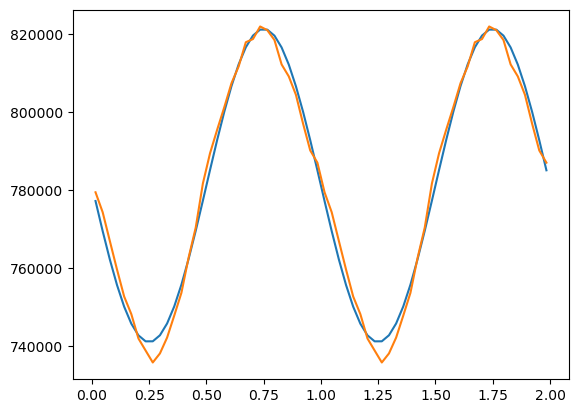

In [8]:
summed_counts = counts.sum(axis=0)

(A1, p1, c1), perr = fitsin(phase_mids, summed_counts)
y=sinfunc(phase_mids, A1, p1, c1)

fig, ax = plt.subplots()

ax.plot(phase_mids, y)
ax.plot(phase_mids,summed_counts)

summed_phase = p1-np.pi

/tmp/ipykernel_225198/3462812762.py:22: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


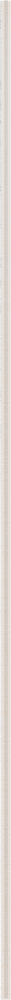

In [10]:
n_plots = n_energies #  n_plots = 2 #  
fig, axes = plt.subplots(n_plots, figsize=(5,0.5*n_plots))

fit_amplitudes = []
fit_phases = []
fit_constants = []
fit_errors = np.empty((n_plots, 3))

for i in range(n_plots):
    counts_slice = counts[i] 
    (A1, p1, c1), perr = fitsin(phase_mids, counts_slice)
    fit_amplitudes.append(A1)
    fit_phases.append(p1)
    fit_constants.append(c1)
    fit_errors[i] = perr
    y=sinfunc(phase_mids, A1, p1, c1)

    axes[i].plot(phase_mids, y)
    axes[i].plot(phase_mids,counts_slice)
    axes[i].set_title(f' energy: {energy_mids[i]:.2f} keV')
    
plt.tight_layout()

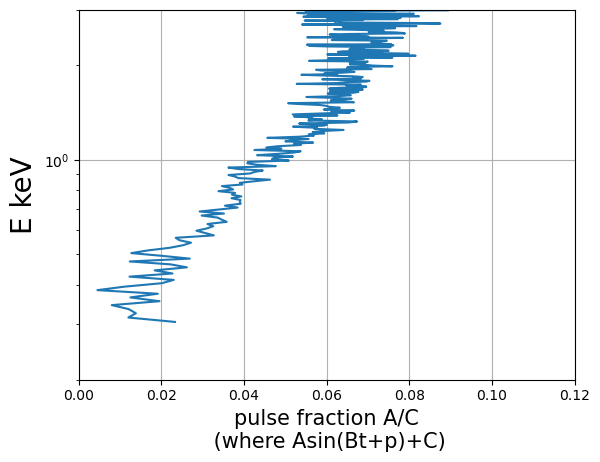

In [11]:
fig, ax = plt.subplots()
ax.semilogy(abs(np.asarray(fit_amplitudes)/fit_constants), energy_mids)
ax.set_ylabel('E keV',fontsize=20)
ax.set_xlabel('pulse fraction A/C\n (where Asin(Bt+p)+C)',fontsize=15)
ax.set_ylim([0.2,3])
ax.set_xlim([0,0.12])
ax.grid()

In [ ]:
# fig, ax = plt.subplots()
# ax.plot(energy_mids, abs(np.asarray(fit_phases-summed_phase)))
# ax.set_ylim([0,1])
# ax.set_xlabel('E keV')
# ax.set_ylabel('fitted phase')
# plt.show()

In [ ]:
a1_sd = fit_errors[:,0]
sd_per_a1 = abs(a1_sd/fit_amplitudes)


fig, ax = plt.subplots()
ax.semilogy(energy_mids, sd_per_a1)
ax.set_xlabel('E keV')
ax.set_ylabel('standard deviation/amplitude')
plt.show()

In [ ]:
p1_sd = fit_errors[:,1]

fig, ax = plt.subplots()
ax.semilogy(energy_mids, p1_sd)
ax.set_xlabel('E keV')
ax.set_ylabel('phase standard deviation')
plt.show()

In [ ]:
c1_sd = fit_errors[:,2]
sd_per_c1 = abs(c1_sd/fit_constants)

fig, ax = plt.subplots()
ax.semilogy(energy_mids, sd_per_c1)
ax.set_xlabel('E keV')
ax.set_ylabel('standard deviation / constant')
plt.show()

## removed sines from signal

In [ ]:
sines = np.empty(counts.shape)
for i, fit_amplitude, fit_phase, fit_constant in zip(range(n_energies), fit_amplitudes, fit_phases, fit_constants):
        sines[i]=sinfunc(phase_mids, fit_amplitude, fit_phase, abs(fit_amplitude))

In [ ]:
background = counts-sines

In [ ]:
plot_one_pulse(background, phase_mids, energy_mids, cm=cm.jet)

In [ ]:
fig, axes = plt.subplots(2,1)

average_counts = counts.sum(axis=1)
average_background = background.sum(axis=1)
average_pulsed = average_counts-average_background

axes[0].semilogy(energy_mids, average_background, label='background')
axes[0].semilogy(energy_mids, average_counts, label='total counts')
axes[1].semilogy(energy_mids, average_pulsed, label='pulsed')
for ax in axes:
    ax.set_xlim([0, 7])
    ax.legend()

In [ ]:
plt.plot(energy_mids, average_pulsed)

In [ ]:
# np.savetxt('J1808_2019_nonpulsed.txt',background)

In [ ]:
# np.linspace(0.015625,1.015625,33)[:-1]
# np.linspace(0.32, 10.48, 255)

In [ ]:
plot_one_pulse(sines, phase_mids, energy_mids, cm=cm.jet)